# Hierarchical clustering - Dendograms

## Table of contents

### [1. Libraries and Data importations](#1)
### [2. Data Subsetting to the 90s](#2)
### [3. Scaling all weather metrics](#3)
### [4. Running the 4 dendograms methods](#4)

-[4.1 Dendograms on all metrics](#4.1)

-[4.2 Dendogram on each weather station](#4.2)
### [5. Principal component reduction (PCA)](#5)

## 1. Libraries and Data importations
<div id='1'></div>

In [62]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score


##to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Creating paths to the data folder of the project and to the folder for saving the charts
path_data = r"C:\Users\dacol\Documents\Data_Project_careerfoundry\ClimateWins_ML\02 Data"

# Importing the unscaled dataframe
df_weather = pd.read_csv(os.path.join(path_data,'Original Data','Dataset-weather-prediction-dataset-processed.csv'), sep =',')

# Importing the rated dataframe for pleasant days
df_rate = pd.read_csv(os.path.join(path_data,'Original Data','Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'), sep =',')

In [64]:
df_weather.shape

(22950, 170)

In [66]:
df_weather.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


In [68]:
df_rate.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 2. Data Subsetting to the 90s
<div id='2'></div>

In [71]:
#Reduce the dataset to the 1990s
df_90 = df_weather[df_weather['DATE'].astype(str).str.contains('199')]
df_90.shape

(3652, 170)

In [73]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
df_to_scale = df_90.drop(['DATE','MONTH'], axis=1)
df_to_scale.shape

(3652, 168)

## 3. Scaling all weather metrics
<div id='3'></div>

In [76]:
#Scaling the wather metrics
scaler = StandardScaler()

#Fit the train data
scaler.fit(df_to_scale)

#Scaling the weather data
df_sc = scaler.transform(df_to_scale)

df_sc

array([[-2.30153798, -0.12337954,  0.74749391, ..., -1.13732223,
        -0.96432689, -1.1354248 ],
       [-1.46017495, -0.12337954,  0.84317061, ..., -1.02830575,
        -0.91396622, -1.00626502],
       [ 1.06391415, -0.12337954,  1.32155413, ..., -0.89203514,
        -0.88878588, -0.79960938],
       ...,
       [ 1.06391415, -0.12337954,  0.84317061, ..., -1.08281399,
        -1.0398679 , -1.21292067],
       [ 0.64323264, -0.12337954,  0.46046379, ..., -0.72851042,
        -0.71252353, -0.6704496 ],
       [ 0.64323264, -0.12337954,  1.03452402, ..., -0.45596921,
        -0.20891681, -0.64461764]])

In [78]:
#Assign the scaled data to DataFrames
df_final = pd.DataFrame(df_sc, index=df_to_scale.index, columns=df_to_scale.columns)

df_final.head()

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
10958,-2.301538,-0.12338,0.747494,0.407104,-0.743295,-0.423475,-0.159903,0.615915,-1.756720,-1.589005,...,-1.680451,-0.075095,-0.633204,-1.047233,0.124855,-0.028673,-0.351473,-1.137322,-0.964327,-1.135425
10959,-1.460175,-0.12338,0.843171,0.669114,-0.875659,-0.423475,-0.159903,-0.524042,-1.715202,-1.635909,...,-0.550975,-0.460994,-0.866248,-1.035329,1.526501,-0.028673,-0.868123,-1.028306,-0.913966,-1.006265
10960,1.063914,-0.12338,1.321554,0.581777,-1.184508,-0.423475,-0.159903,-1.059123,-1.770560,-1.682812,...,-1.115713,0.953971,-0.416805,-0.832962,-0.612094,-0.028673,0.437099,-0.892035,-0.888786,-0.799609
10961,-1.460175,-0.12338,0.173434,1.005984,-0.809477,-0.423475,-0.159903,0.243684,-1.562967,-1.510833,...,0.013763,1.339870,-0.266991,-1.130561,0.717303,-0.028673,-0.895315,-1.246339,-1.593835,-0.722114
10962,0.643233,-0.12338,0.556140,1.267994,-1.151417,-0.351404,-0.159903,-1.012595,-1.466091,-1.510833,...,-1.115713,1.082604,-0.300283,-1.047233,0.197104,-0.028673,-0.569010,-0.455969,-0.284458,-0.541290


## 4. Running the 4 dendograms methods
<div id='4'></div>

### 4.1 Dendograms on all metrics
<div id='4.1'></div>

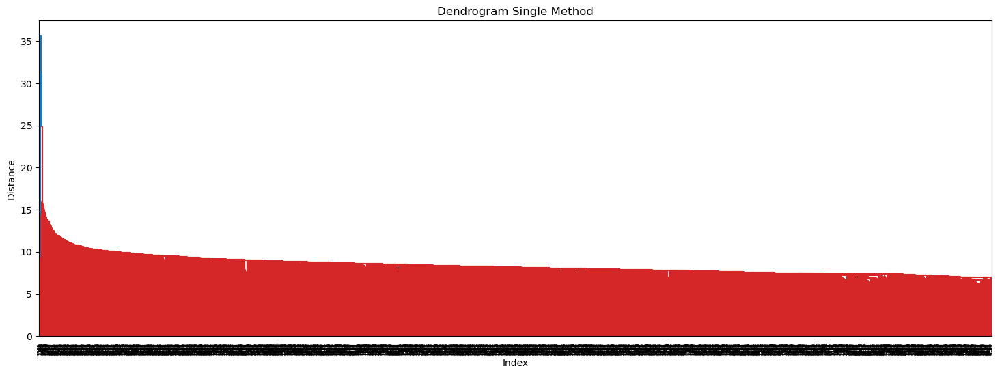

Silhouette Score for Single method: 0.593


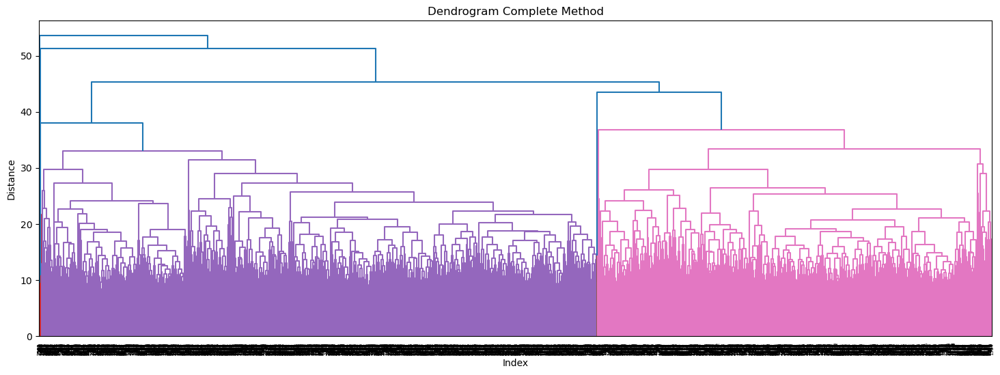

Silhouette Score for Complete method: 0.593


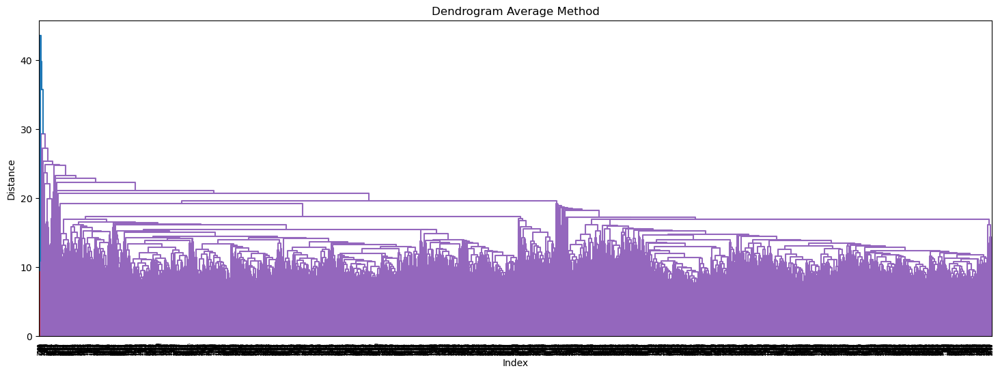

Silhouette Score for Average method: 0.593


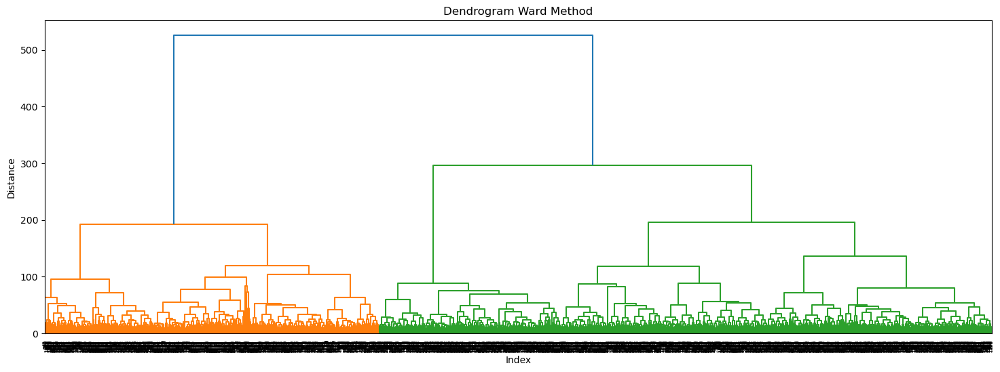

Silhouette Score for Ward method: 0.202


In [82]:
methods = ['single', 'complete', 'average', 'ward']
for method in methods:
    plt.figure(figsize=(18, 6))
    distance = linkage(df_final, method=method)
    dendrogram(distance, leaf_rotation=90)
    plt.xlabel('Index')
    plt.ylabel('Distance')
    plt.title(f'Dendrogram {method.capitalize()} Method')
    plt.show()

    # Create clusters
    clusters = fcluster(distance, 2, criterion='maxclust')
    
    # Calculate silhouette score
    silhouette_avg = silhouette_score(df_final, clusters)
    print(f'Silhouette Score for {method.capitalize()} method: {silhouette_avg:.3f}')

### 4.2 Dendogram on each weather station
<div id='4.2'></div>

In [10]:
weather_stations = [col.split('_')[0] for col in df_rate.columns if '_pleasant_weather' in col]
weather_stations

['BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA']

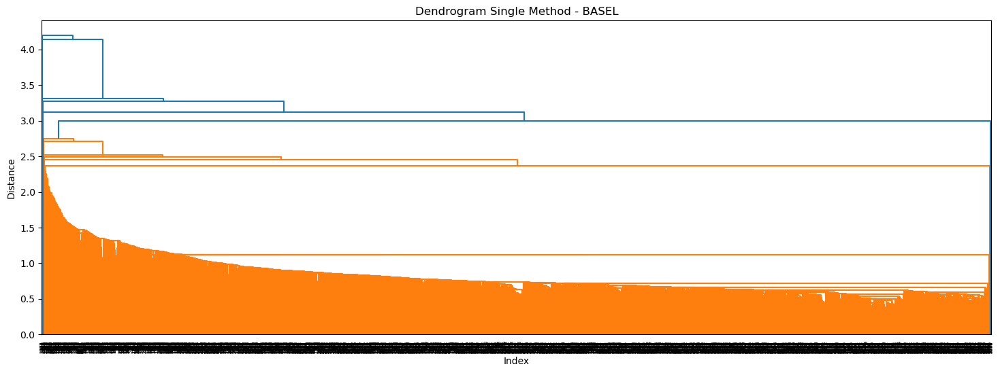

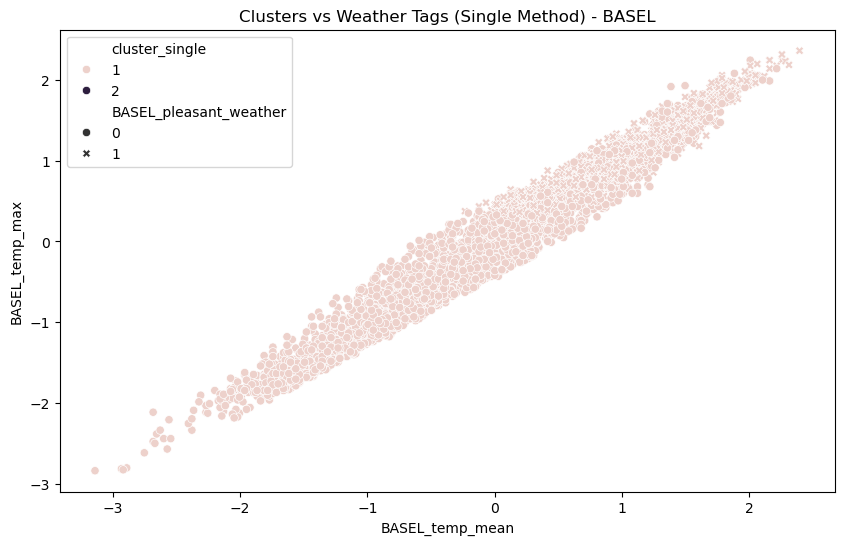

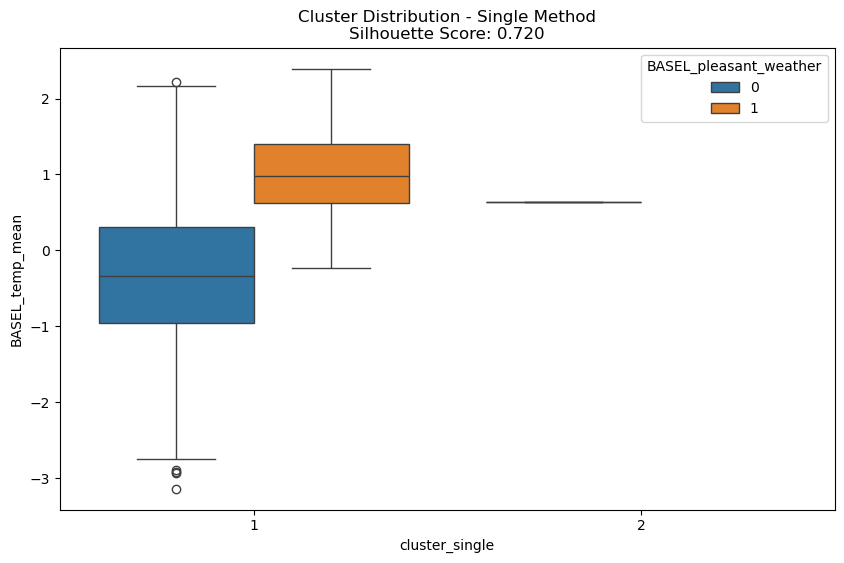

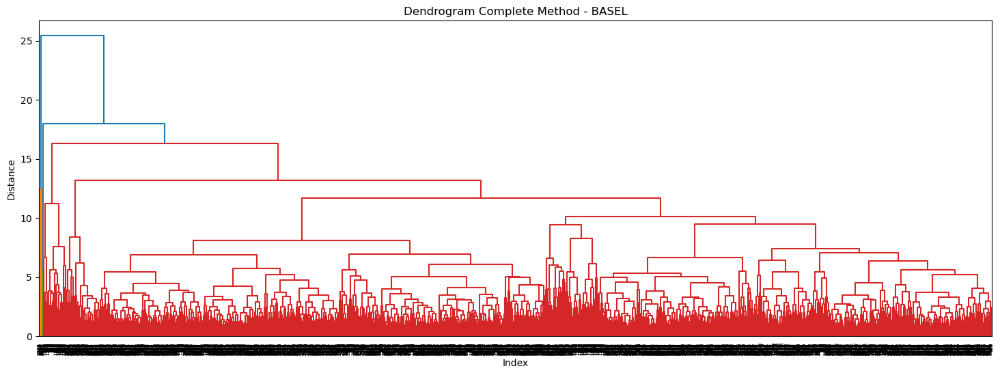

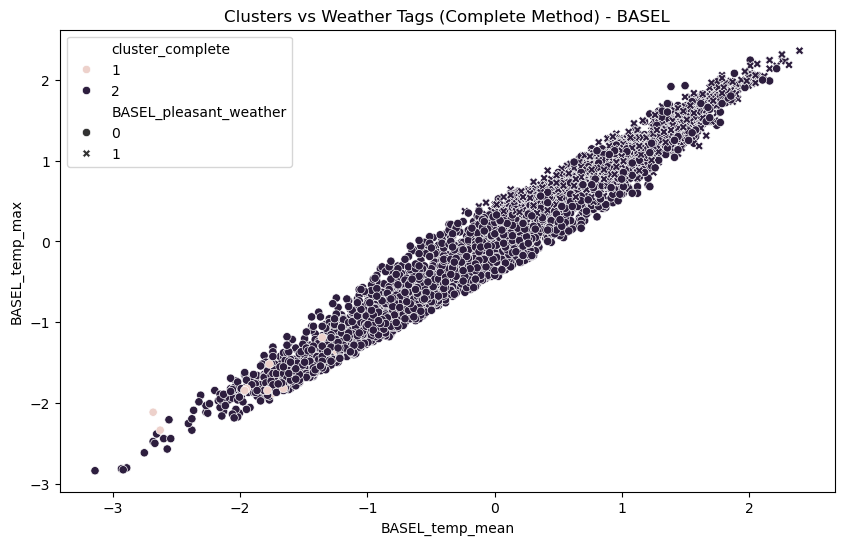

...

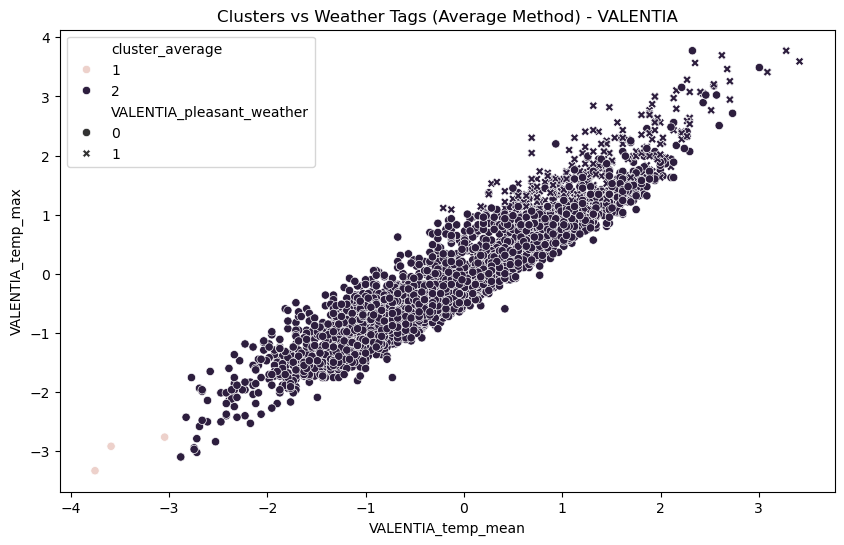

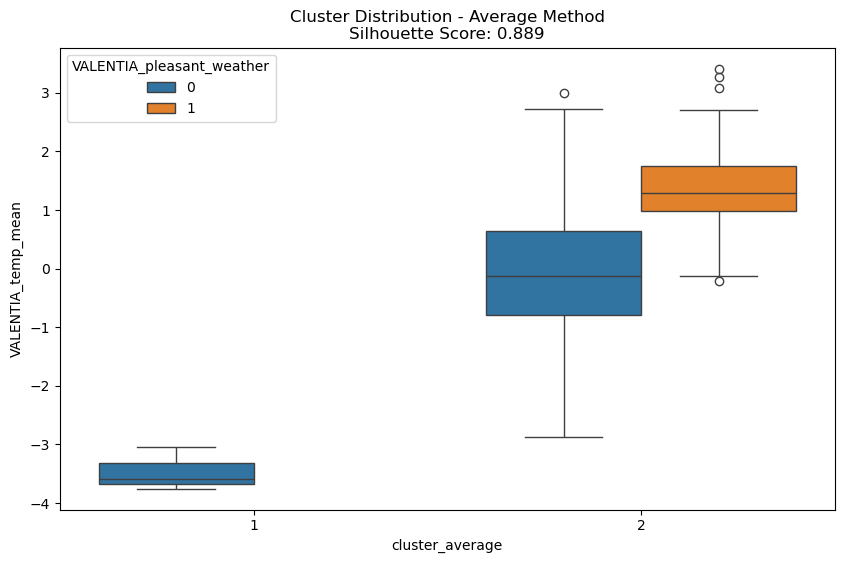

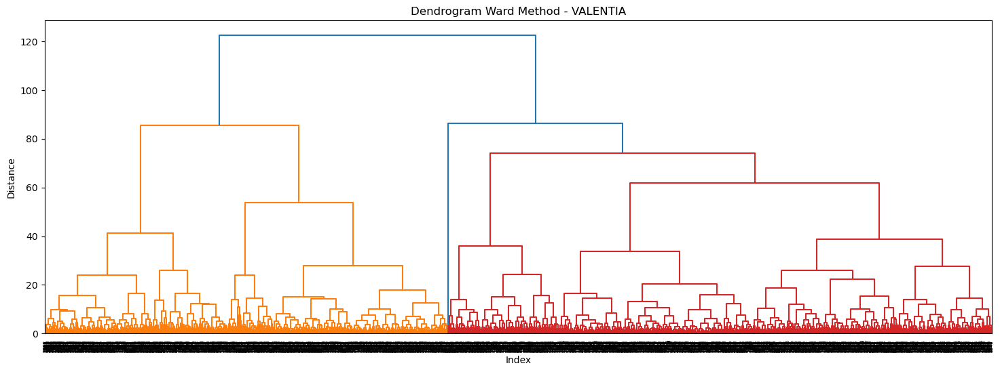

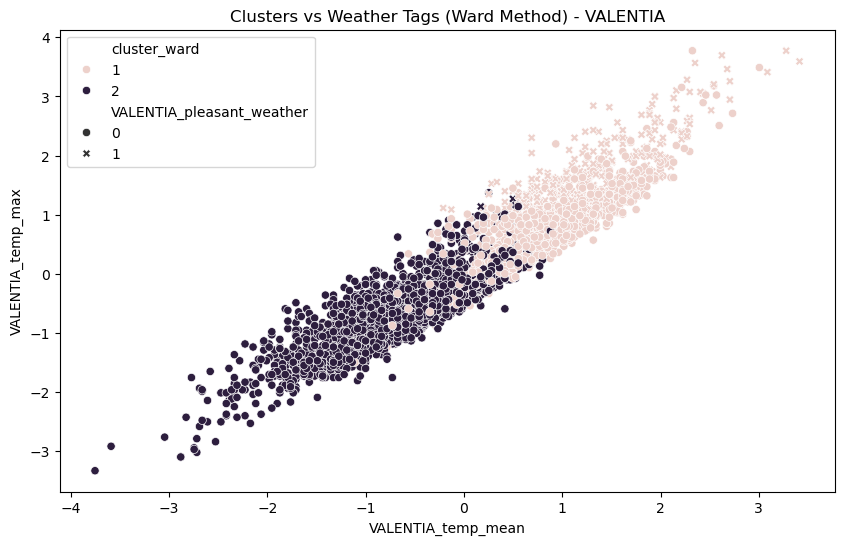

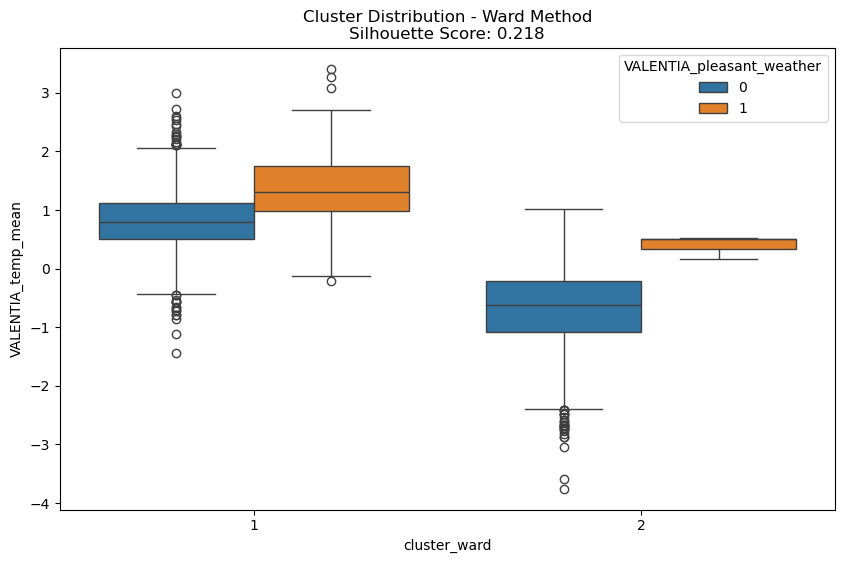

In [17]:
for station in weather_stations:
    # Select the columns for the current weather station
    df_90 = df_weather[df_weather['DATE'].astype(str).str.contains('199')]    
    df_station = df_90[[col for col in df_90.columns if col.startswith(station)]]
    
    # Preserve the original index and date
    original_index = df_station.index
    original_date = df_90.loc[original_index, 'DATE']
    
    # Scale the weather metrics
    scaler = StandardScaler()
    df_sc = scaler.fit_transform(df_station)
    df_final = pd.DataFrame(df_sc, index=original_index, columns=df_station.columns)
    
    # Add the DATE column back to df_final
    df_final['DATE'] = original_date
    
    # Create dendrograms and clusters for each method
    for method in methods:
        distance = linkage(df_final.drop('DATE', axis=1), method=method)
        
        # Plot dendrogram
        plt.figure(figsize=(18, 6))
        dendrogram(distance, leaf_rotation=90)
        plt.xlabel('Index')
        plt.ylabel('Distance')
        plt.title(f'Dendrogram {method.capitalize()} Method - {station}')
        plt.show()
        
        # Create clusters
        df_final[f'cluster_{method}'] = fcluster(distance, 2, criterion='maxclust')
        
        # Merge the clusters with the weather tags
        df_merged = pd.merge(df_final, df_rate[['DATE', f'{station}_pleasant_weather']], on='DATE', how='left')
        
        # Plot the clusters against the weather tags
        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            data=df_merged, 
            x=f'{station}_temp_mean', 
            y=f'{station}_temp_max', 
            hue=f'cluster_{method}', 
            style=f'{station}_pleasant_weather'
        )
        plt.title(f'Clusters vs Weather Tags ({method.capitalize()} Method) - {station}')
        plt.show()


        # Compute silhouette score
        silhouette_avg = silhouette_score(
        df_merged.drop(['DATE', f'{station}_pleasant_weather', f'cluster_{method}'], axis=1), 
        df_merged[f'cluster_{method}']
        )
    
        plt.figure(figsize=(10, 6))
        sns.boxplot(
        x=f'cluster_{method}', 
        y=f'{station}_temp_mean', 
        hue=f'{station}_pleasant_weather', 
        data=df_merged
        )
        plt.title(f'Cluster Distribution - {method.capitalize()} Method\nSilhouette Score: {silhouette_avg:.3f}')
        plt.show()

## 5. Principal component reduction (PCA)

In [84]:
from sklearn.decomposition import PCA

In [86]:
#Run the PCA model, reducing to 15 components, one for each waether station

num_components = 15
pca = PCA(n_components=num_components)

#ressetting df_final to all weather stations
df_to_scale = df_weather[df_weather['DATE'].astype(str).str.contains('199')]
df_sc = scaler.fit_transform(df_to_scale)
df_final = pd.DataFrame(df_sc, index=df_to_scale.index, columns=df_to_scale.columns)

principalComponents = pca.fit_transform(df_final)

In [88]:
principalComponents.shape

(3652, 15)

In [90]:
# Create a list of column names
pca_columns = [f'PCA{i+1}' for i in range(num_components)]

#Make a dataframe of the new components
dfPCA = pd.DataFrame(principalComponents, columns=pca_columns)

In [92]:
dfPCA.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,PCA13,PCA14,PCA15
0,-11.782677,2.399306,2.319071,-0.608512,2.429393,-3.130206,0.210910,-2.655356,1.368434,-1.876183,-1.487553,0.214804,-0.067019,0.384213,-0.702099
1,-11.992257,2.310076,1.820988,0.249544,2.128963,-1.967802,0.598078,-1.901219,1.019561,-3.017069,-1.941582,0.370212,-1.586089,0.541240,-1.005095
2,-12.161448,1.712818,1.677493,0.303571,1.594922,-1.356327,-0.923173,-1.645657,0.083215,-1.561668,-0.425172,0.817096,0.526541,0.247206,-1.261918
3,-11.226526,4.744294,3.060898,-1.300980,-0.085463,-0.062777,0.235898,0.301651,0.428341,-1.814844,-0.655593,0.597563,-1.768163,0.152916,-1.028922
4,-10.966528,3.047329,4.736358,0.909735,-0.340148,-1.570262,-1.701501,0.835218,-1.351558,-0.533066,0.373928,1.113224,-0.856523,0.018786,-1.604831


In [94]:
#saving the reduced date frame to a pickle file
dfPCA.to_pickle(os.path.join(path_data,'Prepared Data','PCA_90s.pkl'))